In [9]:
import json
import os
import math

import cv2
import pandas as pd
import numpy as np

from model.utils import (load_image, change_image_brightness, 
                         translate_image, bool_flip_image)

import matplotlib.pyplot as plt
%matplotlib inline

# Data exploration

In [10]:
# Loading CSV data to a pandas dataframe
print("Loading CSV file...")
df = pd.read_csv('data/driving_log.csv')
print("Size of the dataset: {}".format(df.shape))
df.head()

Loading CSV file...
Size of the dataset: (8036, 7)


,center,left,right,steering,throttle,brake,speed
0,IMG/center_2016_12_01_13_30_48_287.jpg,IMG/left_2016_12_01_13_30_48_287.jpg,IMG/right_2016_12_01_13_30_48_287.jpg,0.0,0.0,0.0,22.148290
1,IMG/center_2016_12_01_13_30_48_404.jpg,IMG/left_2016_12_01_13_30_48_404.jpg,IMG/right_2016_12_01_13_30_48_404.jpg,0.0,0.0,0.0,21.879630
2,IMG/center_2016_12_01_13_31_12_937.jpg,IMG/left_2016_12_01_13_31_12_937.jpg,IMG/right_2016_12_01_13_31_12_937.jpg,0.0,0.0,0.0,1.453011
3,IMG/center_2016_12_01_13_31_13_037.jpg,IMG/left_2016_12_01_13_31_13_037.jpg,IMG/right_2016_12_01_13_31_13_037.jpg,0.0,0.0,0.0,1.438419
4,IMG/center_2016_12_01_13_31_13_177.jpg,IMG/left_2016_12_01_13_31_13_177.jpg,IMG/right_2016_12_01_13_31_13_177.jpg,0.0,0.0,0.0,1.418236


In [3]:
print("Some information about numeric fields (steering angle, throttle, brake, speed)...")
df.describe()

Some information about numeric fields (steering angle, throttle, brake, speed)...


,steering,throttle,brake,speed
count,8036.000000,8036.000000,8036.000000,8036.000000
mean,0.004070,0.869660,0.001970,28.169839
std,0.128840,0.301326,0.036565,6.149327
min,-0.942695,0.000000,0.000000,0.502490
25%,0.000000,0.985533,0.000000,30.183093
50%,0.000000,0.985533,0.000000,30.186400
75%,0.000000,0.985533,0.000000,30.186640
max,1.000000,0.985533,1.000000,30.709360


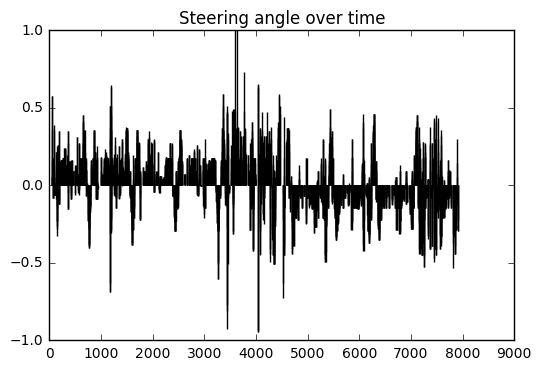

In [4]:
def plot_steering_angle_over_time(dataframe):
    plt.bar(dataframe.steering.index, df.steering.values, width=0.01)
    plt.title("Steering angle over time")
    plt.show()

plot_steering_angle_over_time(df)

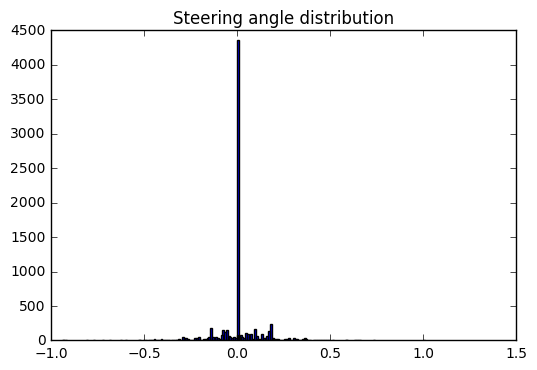

In [5]:
def plot_steering_angle_distribution(dataframe):
    hist = dataframe.steering.value_counts()
    plt.bar(hist.index, hist.values, width=0.01)
    plt.title("Steering angle distribution")
    plt.show()

plot_steering_angle_distribution(df)

Testing basic plotting functions...


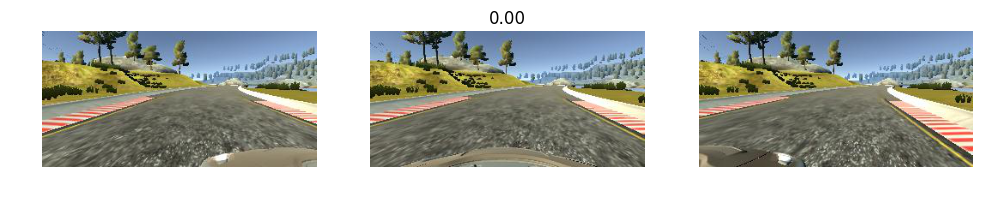

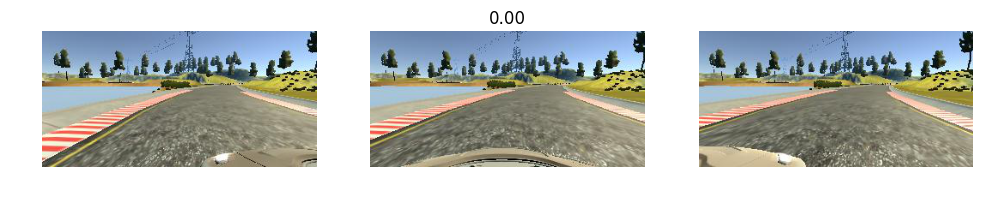

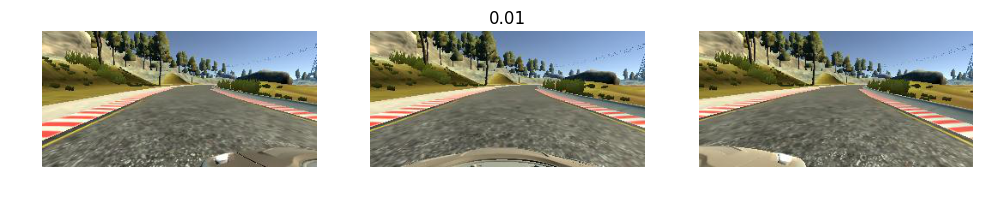

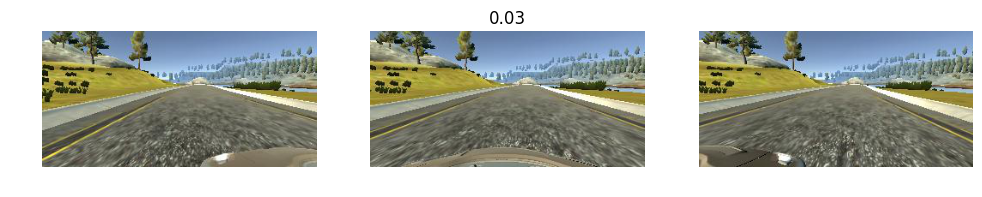

In [6]:
def get_images(img):
    img_c = load_image(img.center.strip())
    img_l = load_image(img.left.strip())
    img_r = load_image(img.right.strip())
    return img_l, img_c, img_r

def print_row(img_l, img_c, img_r, steering, plot_scale=1):
    plt.figure(figsize=(12 / plot_scale, 2))
    plt.subplot(1, 3, 1)
    plt.imshow(img_l);
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(img_c);
    plt.axis('off')
    plt.title('{:.2f}'.format(steering));

    plt.subplot(1, 3, 3)
    plt.imshow(img_r);
    plt.axis('off');

def test_basic_plot_functions(dataframe):
    print("Testing basic plotting functions...")
    rows = dataframe.sample(4)
    for index, row in rows.iterrows():
        img_l, img_c, img_r = get_images(row)
        print_row(img_l, img_c, img_r, row.steering)

test_basic_plot_functions(df)

# Testing augmentations

The following functions test and visualize the methods in model.utils

Testing brightness augmentation...


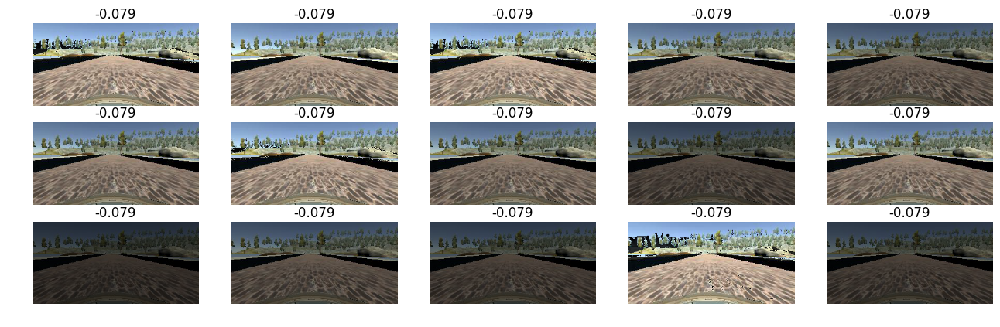

In [7]:
# Test Brightness augmentation
def test_change_image_brightness(dataframe):
    print("Testing brightness augmentation...")
    row = dataframe.sample().iloc[0]
    img_l, img_c, img_r = get_images(row)
    plt.figure(figsize=(16, 8))
    for idx in range(15):
        img, angle = change_image_brightness(img_c, row.steering)
        plt.subplot(5, 5, idx + 1)
        plt.title(np.round(angle, 3))
        plt.imshow(img)
        plt.axis('off')

test_change_image_brightness(df)

Testing image translation from a random original image...


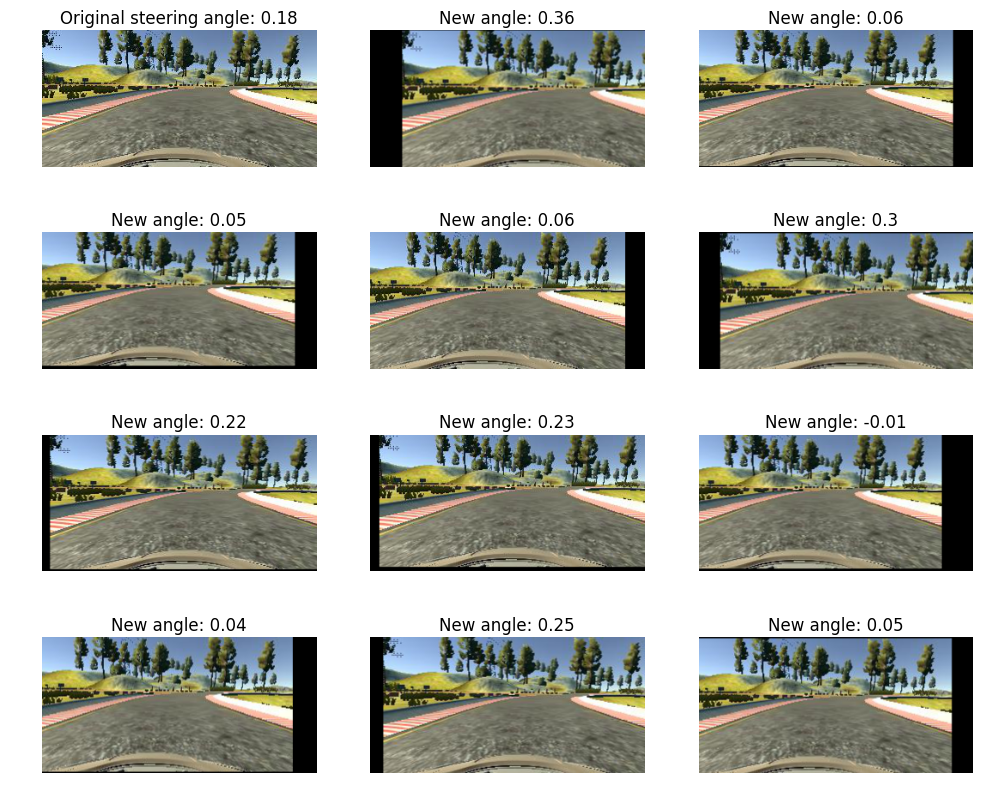

In [8]:
# Test Shift translation augmentation
def test_translate_image(dataframe):
    print("Testing image translation from a random original image...")
    row = dataframe[dataframe['steering'] > .1].sample().iloc[0]
    img_l, img_c, img_r = get_images(row)

    # Define the grid where the images are plotted
    plt.figure(figsize=(12, 10))

    # Plot the original image
    plt.subplot(4, 3, 1)
    plt.imshow(img_c)
    plt.title('Original steering angle: {}'.format(np.round(row.steering, 2)))
    plt.axis('off')

    # Generate 11 new images, applying translations to the original 
    # and plot in the grid
    for i in range(11):
        plt.subplot(4, 3, i+2)
        image_tr, angle = translate_image(img_c, row.steering, 80)
        plt.title('New angle: {}'.format(np.round(angle, 2)))
        plt.imshow(image_tr)
        plt.axis('off');

test_translate_image(df)

Testing the flipping augmentation with 4 random rows with angles different than 0...


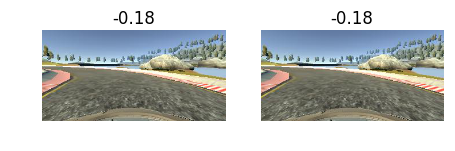

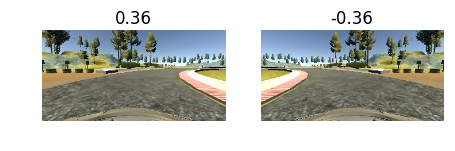

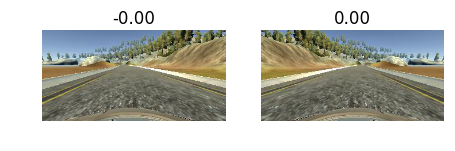

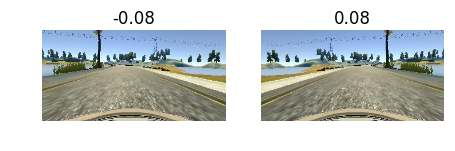

In [9]:
# Test Flipping the images horizontally augmentation: 
def test_bool_flip_image(dataframe):
    print("Testing the flipping augmentation with 4 random rows with angles different than 0...")
    rows = dataframe[dataframe['steering'] != 0].sample(4)
    for index, row in rows.iterrows():
        img_l, img_c, img_r = get_images(row)
        img_c2, steering2 = bool_flip_image(img_c, row.steering)

        plt.figure(figsize=(8, 2))

        plt.subplot(1, 3, 1)
        plt.imshow(img_c);
        plt.axis('off')
        plt.title('{:.2f}'.format(row.steering));

        plt.subplot(1, 3, 2)
        plt.imshow(img_c2);
        plt.axis('off')
        plt.title('{:.2f}'.format(steering2));
        
test_bool_flip_image(df)

In [10]:
def test_preprocess_image(model, dataframe):
    print("Testing the image preprocessing with 4 random images...")
    rows = dataframe.sample(3)
    for index, row in rows.iterrows():
        img_l, img_c, img_r = get_images(row)
        img_l = model.preprocess_image(img_l)
        img_c = model.preprocess_image(img_c)
        img_r = model.preprocess_image(img_r)
        print_row(img_l, img_c, img_r, row.steering)

Testing the image preprocessing with 4 random images...


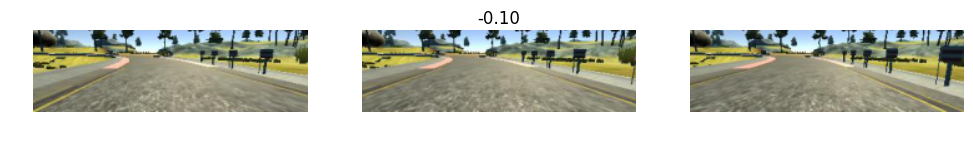

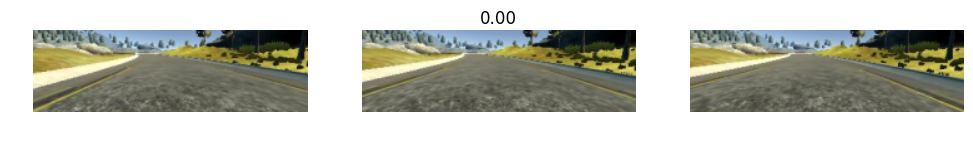

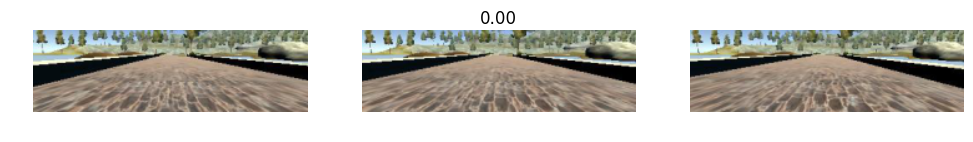

In [11]:
# Testing NVIDIA model image preprocessing
from model.nvidia import NvidiaModel
nvidia = NvidiaModel()        
test_preprocess_image(nvidia, df)

Testing the image preprocessing with 4 random images...


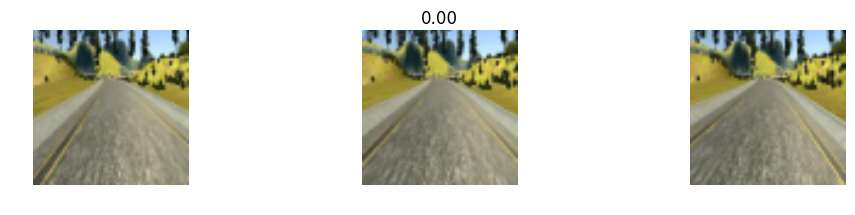

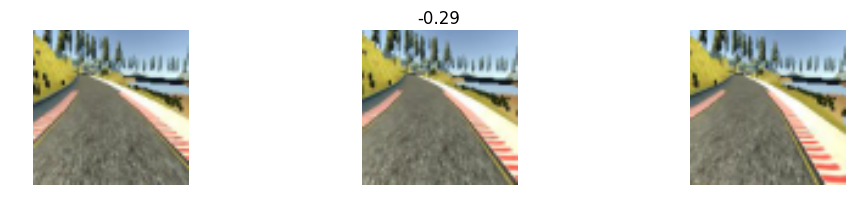

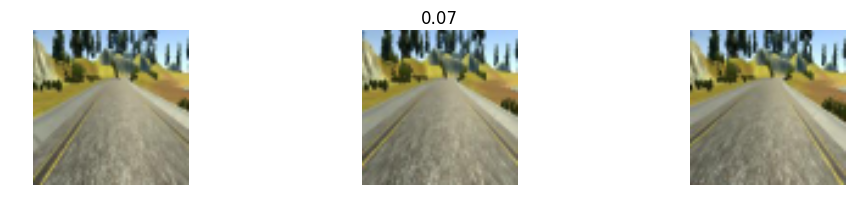

In [12]:
# Testing Custom model image preprocessing
from model.custom import CustomModel
custom = CustomModel()        
test_preprocess_image(custom, df)

In [13]:
def test_training_preprocess_image(model, dataframe):
    """
    Print the same image 16 times, using randomly augmentations
    """
    print("Testing the training image preprocessing...")
    row = dataframe.sample().iloc[0]
    plt.figure(figsize=(16, 10))
    for idx in range(12):
        img, steer = model.training_preprocess_image(row)
        plt.subplot(3, 4, idx + 1)
        plt.imshow(img);
        plt.axis('off')
        plt.title('{:.2f}'.format(steer));

Testing the training image preprocessing...


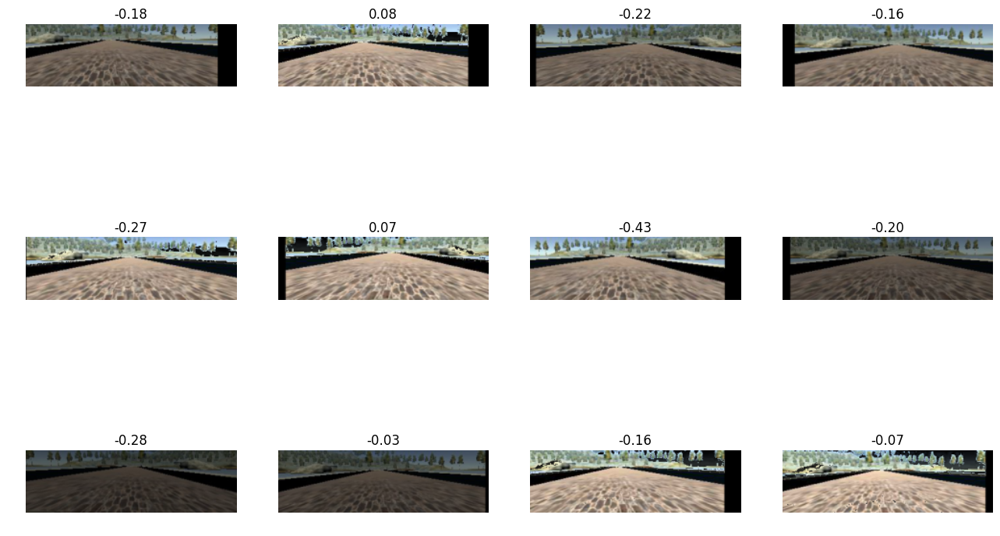

In [14]:
test_training_preprocess_image(nvidia, df)

Testing the training image preprocessing...


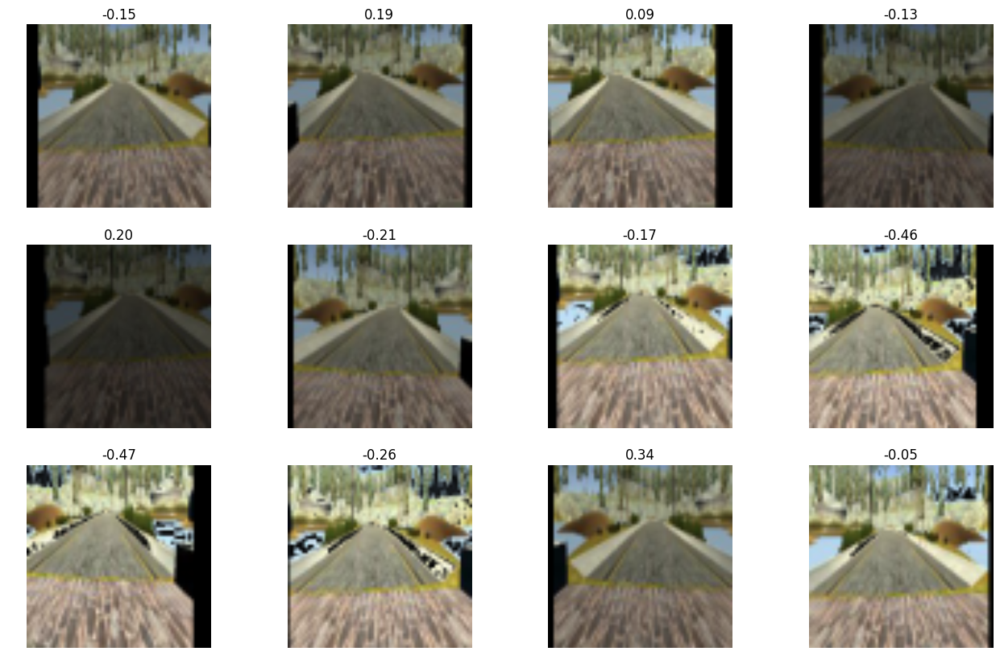

In [15]:
test_training_preprocess_image(custom, df)

In [16]:
def test_training_data_generator(model, dataframe):
    print("Testing the training data generator...")
    tdg = model.training_data_generator(dataframe, 16)
    for batch_idx in range(2):
        batch_images, batch_steering = next(tdg)
        print("   Generating batch #{}...".format(batch_idx))
        plt.figure(figsize=(16, 8))
        for i, img in enumerate(batch_images):
            plt.subplot(4, 8, i + 1)
            plt.imshow(img);
            plt.axis('off')
            plt.title('{:.2f}'.format(batch_steering[i]));

Testing the training data generator...
   Generating batch #0...
   Generating batch #1...


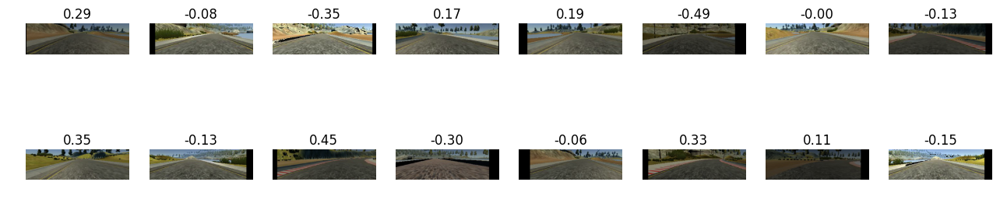

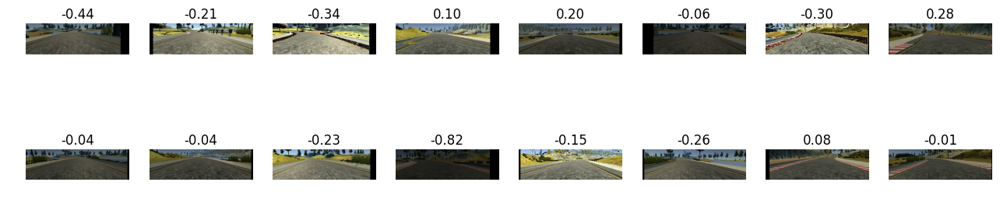

In [17]:
test_training_data_generator(nvidia, df)

Testing the training data generator...
   Generating batch #0...
   Generating batch #1...


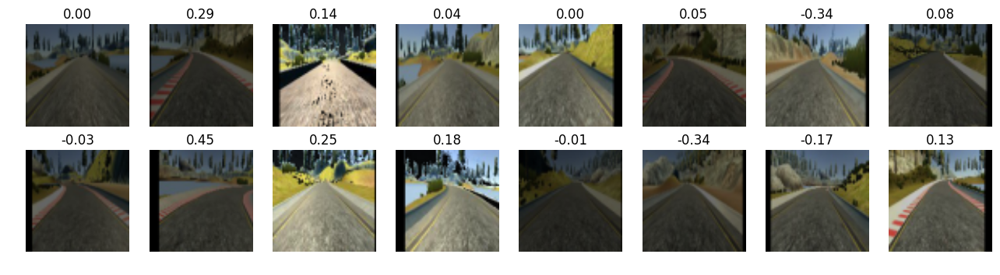

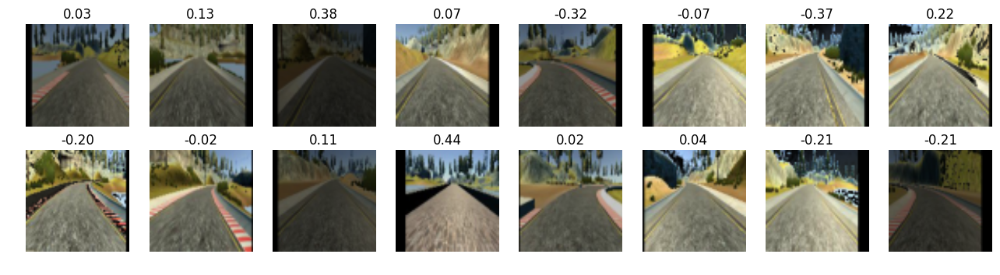

In [18]:
test_training_data_generator(custom, df)

In [19]:
def test_validation_preprocess_image(model, dataframe):
    print("Testing the validation image processing...")
    plt.figure(figsize=(16, 8))
    rows = dataframe.sample(4)
    idx = 0
    for index, row in rows.iterrows():
        img = model.validation_preprocess_image(row)
        plt.subplot(4, 8, idx+1)
        plt.imshow(img);
        plt.axis('off')
        plt.title('{:.2f}'.format(row.steering));
        idx += 1

Testing the validation image processing...


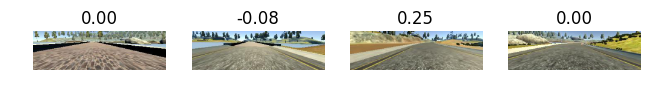

In [20]:
test_validation_preprocess_image(nvidia, df)

In [21]:
def test_validation_data_generator(model, dataframe):
    print("Testing the validation data generator...")
    print("")
    vdg = model.validation_data_generator(dataframe, 16)
    for batch_idx in range(2):
        batch_images, batch_steering = next(vdg)
        print("   Generating batch #{}...".format(batch_idx))
        plt.figure(figsize=(16, 8))
        for i, img in enumerate(batch_images):
            plt.subplot(4, 8, i + 1)
            plt.imshow(img);
            plt.axis('off')
            plt.title('{:.2f}'.format(batch_steering[i]));

Testing the validation data generator...

   Generating batch #0...
   Generating batch #1...


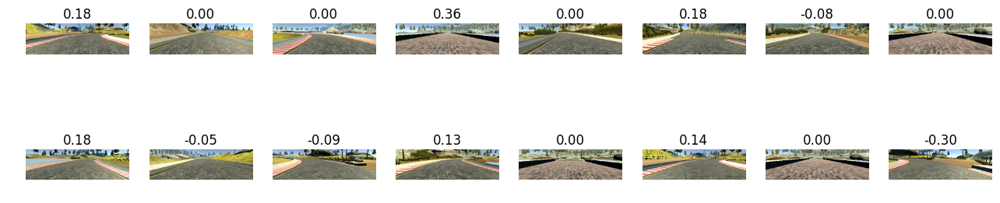

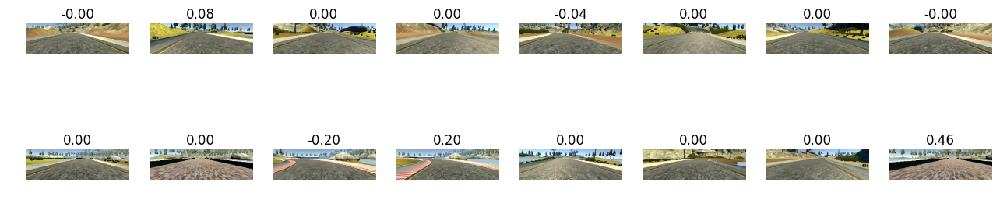

In [22]:
test_validation_data_generator(nvidia, df)

Testing the validation data generator...

   Generating batch #0...
   Generating batch #1...


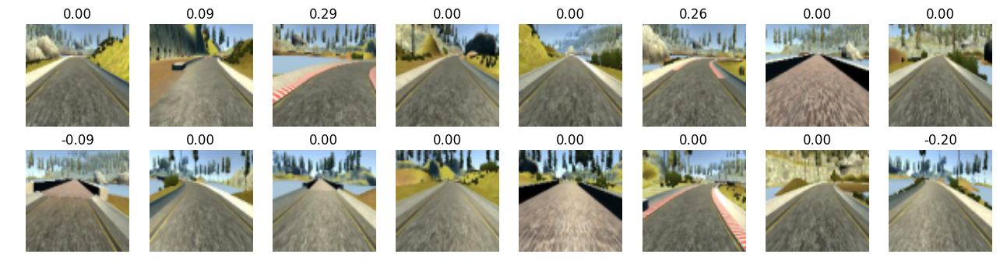

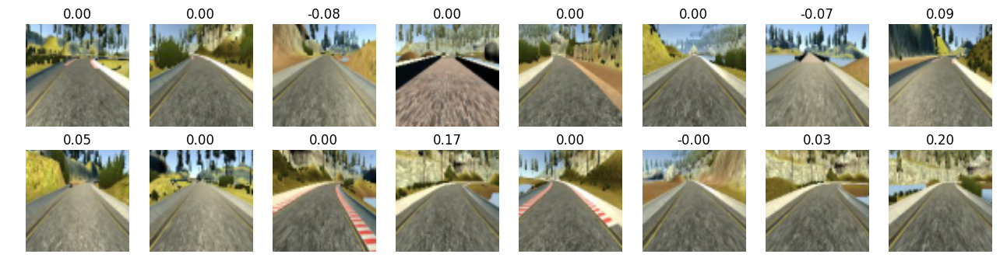

In [ ]:
test_validation_data_generator(custom, df)

## Training the network


In [ ]:
from model.nvidia import NvidiaModel
nvidia = NvidiaModel()        
nvidia.train_model(epochs=15, batch_size=256)

v7
Training model:nvidia, image size(66, 220)
____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
lambda_3 (Lambda)                (None, 66, 220, 3)    0           lambda_input_3[0][0]             
____________________________________________________________________________________________________
convolution2d_6 (Convolution2D)  (None, 31, 108, 24)   1824        lambda_3[0][0]                   
____________________________________________________________________________________________________
convolution2d_7 (Convolution2D)  (None, 14, 52, 36)    21636       convolution2d_6[0][0]            
____________________________________________________________________________________________________
convolution2d_8 (Convolution2D)  (None, 5, 24, 48)     43248       convolution2d_7[0][0]            
_____________________________________________